center> <img src="https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fmiro.medium.com%2Fmax%2F450%2F1*CXZ804tKLPy2hiikJbYH3w.png&f=1&nofb=1" width=25% > </center>

<br><br>

<center> 
    <font size="6">Lab 4: Image Alignment, Image Stitching and Panorama Creation</font>
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59PM, October 7th, 2025 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>PhD TA: Yue Li</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID:  16235347\
Student1 Name: May Daniel Ben Zion

Student2 ID: 13864149 \
Student2 Name: Jonas Elzinga

Student3 ID: 15990834 \
Student3 Name: Vlad Chibulcutean

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [159]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [160]:
# environment and libraries
import os
import math
import time
import cv2
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import random

from tqdm.notebook import tqdm
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy import signal
from matplotlib.patches import ConnectionPatch

In [161]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 4 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=CV1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Image Alignment (55 points)](#section-1)
  - [Question 1 (5 points)](#question-1)
  - [Question 2 (10 points)](#question-2)
  - [Question 3 (15 points)](#question-3)
  - [Question 4 (5 points)](#question-4)
  - [Question 5 (5 points)](#question-5)
  - [Question 6 (3 points)](#question-6)
  - [Question 7 (5 points)](#question-7)
  - [Question 8 (7 points)](#question-8)
  
- [Section 2: Image Stitching (30 points)](#section-2)
  - [Question 9 (20 points)](#question-9)
  - [Question 10 (5 points)](#question-10)
  - [Question 11 (5 points)](#question-11)
  
- [Section 3: Automatic Panorama Stitching (15 points)](#section-3)
  - [Question 12 (15 points)](#question-12)
  
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Image Alignment**

In this section, you will develop a function that computes the affine transformation between two images. The goal is to align two supplied images from *Genoa Beach* by following a series of steps that involve detecting interest points, characterizing their local appearances, and matching these regions between the images. This process is fundamental in many computer vision tasks, such as object recognition, image stitching, and motion tracking.

The overall procedure is outlined as follows:

1. **Detect Interest Points:**
   - Identify key points in each image that are likely to be matched between the two images.

2. **Characterize Local Appearance:**
   - Describe the local appearance around each interest point using a region descriptor.

3. **Find Matches:**
   - Match the region descriptors between the two images to identify corresponding points. You can use David Lowe's SIFT (Scale-Invariant Feature Transform) for these steps. SIFT is a powerful method for detecting and describing local features in images. For further information, refer to the [SIFT tutorial](https://docs.opencv.org/3.4.2/da/df5/tutorial_py_sift_intro.html) and the [SIFT class documentation](https://docs.opencv.org/3.4.2/d5/d3c/classcv_1_1xfeatures2d_1_1SIFT.html).

4. **Perform RANSAC (Random Sample Consensus):**
   - To find the best transformation, perform the following steps:
     - **Repeat N times:**
       - Randomly select a set of P matched pairs from the total set of matches.
       - Construct a matrix A and vector b using the P pairs of points. Solve for the affine transformation parameters $m_1, m_2, m_3, m_4, t_1, t_2$ by solving the equation $Ax = b$. This equation can be solved using the inverse $x = (A^T A)^{-1} A^T b$ using Python's Numpy package.
       - Apply the transformation to all matched points in the first image. If the transformation is accurate, the transformed points should lie close to their corresponding points in the second image.
       - Count the number of inliers, where inliers are defined as points from the first image that, when transformed, lie within a radius of 10 pixels from their corresponding points in the second image.
       - If the number of inliers exceeds the best count so far, save the transformation parameters and the set of inliers.

5. **Visualize RANSAC Performance:**
   - Plot the two images side by side and draw lines connecting the original points in the first image with their corresponding transformed points in the second image.

6. **Transform the First Image:**
   - Use the final set of transformation parameters to transform the first image. The transformed image should align with the second image. Implement this transformation using **nearest-neighbor interpolation**. Additionally, use OpenCV's built-in function `cv2.warpAffine` to compare results. Note that nearest-neighbor interpolation involves rounding the coordinates of the transformed points, which is simpler to implement than linear interpolation.

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (5 points)</font>

Create a function named **get_matching_keypoints()** that takes two images as input and returns the matching keypoints between them.

The function should use the SIFT (Scale-Invariant Feature Transform) algorithm to detect and describe keypoints in both images. Once the keypoints are detected, use a brute-force matcher with Euclidean distance to find and return the matches between the two images. Make sure to convert the images to grayscale for processing.

The function should return the keypoints detected in the first image, the keypoints detected in the second image, and the matches found between them. Ensure that the function prints the number of keypoints detected in each image, as well as the number of matches found.

To test your function, use the images `genoa_beach.jpg` and `genoa_beach_cut_1.jpg`.

**Note:** You can use the OpenCV library to implement the SIFT algorithm.

In [162]:
def get_matching_keypoints(image_1, image_2):
    """
    Given two input images, find and return the matching keypoints.

    Args:
        image_1: The first image (in RGB)
        image_2: The second image (in RGB)

    Returns:
        keypoints_image_1: Keypoints detected in the first image
        keypoints_image_2: Keypoints detected in the second image
        matches: Matching keypoints between the two images
    """

    print('Finding matching features...')

    # Convert the images to grayscale
    image_1_grayscale = cv2.cvtColor(image_1, cv2.COLOR_RGB2GRAY)
    image_2_grayscale = cv2.cvtColor(image_2, cv2.COLOR_RGB2GRAY)

    # Detect keypoints in image_1 and image_2 using SIFT
    sift = cv2.SIFT_create()
    keypoints_image_1, descriptors_image_1 = sift.detectAndCompute(image_1_grayscale, None)
    keypoints_image_2, descriptors_image_2 = sift.detectAndCompute(image_2_grayscale, None)

    if descriptors_image_1 is None or descriptors_image_2 is None:
        print("No descriptors found in one or both images.")
        return [], [], []

    # Find the matches between the two images using a brute-force matcher with Euclidean distance
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = sorted(bf.match(descriptors_image_1, descriptors_image_2), key=lambda x: x.distance)

    # Output the number of keypoints and matches
    print(f"Number of keypoints in the first image:  {len(keypoints_image_1)}")
    print(f"Number of keypoints in the second image: {len(keypoints_image_2)}")
    print(f"Number of matches: {len(matches)}")

    return keypoints_image_1, keypoints_image_2, matches

In [163]:
# read the images
image_1 = cv2.cvtColor(cv2.imread('images/genoa_beach.jpg'), cv2.COLOR_BGR2RGB)
image_2 = cv2.cvtColor(cv2.imread('images/genoa_beach_cut_1.jpg'), cv2.COLOR_BGR2RGB)

# find the matching keypoints between the two images
keypoints_image_1, keypoints_image_2, matches = get_matching_keypoints(image_1, image_2)

Finding matching features...
Number of keypoints in the first image:  14514
Number of keypoints in the second image: 10245
Number of matches: 14514


<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (10 points)</font>

Create a function named `draw_random_matches` that takes the matching keypoints found in Question 1, selects a random subset of 10 matching points, and plots them on the images.

The function should connect matching pairs with lines, assigning a random color to each line to make them easier to distinguish. Ensure that the keypoints are marked on both images and that the matching lines are clearly visible. The images should be displayed side by side for easy comparison.

**Hint:** Use `from matplotlib.patches import ConnectionPatch` for drawing the lines between matching keypoints.

In [164]:
def draw_random_matches(image_1, keypoints_1, image_2, keypoints_2, matches, subset_size=10):
    """
    Draw a random subset of matching keypoints between two images.

    Args:
        image_1: The first image (in RGB)
        keypoints_1: Keypoints detected in the first image
        image_2: The second image (in RGB)
        keypoints_2: Keypoints detected in the second image
        matches: Matching keypoints between the two images
        subset_size: Number of random matches to display (default is 10)

    Returns:
        None. The function displays the images with the matching keypoints.
    """

    if len(matches) < subset_size:
        print(f"Warning: Only {len(matches)} matches available, using all of them.")
        subset_size = len(matches)

    # Select random subset of matches
    random_indices = random.sample(range(len(matches)), subset_size)
    selected_matches = [matches[i] for i in random_indices]

    # Create figure with two subplots side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Display images
    ax1.imshow(image_1)
    ax1.set_title('Image 1')
    ax1.axis('off')

    ax2.imshow(image_2)
    ax2.set_title('Image 2')
    ax2.axis('off')

    # Generate random colors for each match
    colors = [np.random.rand(3,) for _ in range(subset_size)]

    # Draw keypoints and connections
    for i, match in enumerate(selected_matches):
        # Get keypoint coordinates
        pt1 = keypoints_1[match.queryIdx].pt  # Point in first image
        pt2 = keypoints_2[match.trainIdx].pt  # Point in second image

        # Draw keypoints in each image
        ax1.plot(pt1[0], pt1[1], 'o', color=colors[i], markersize=8, markeredgecolor='white', markeredgewidth=1)
        ax2.plot(pt2[0], pt2[1], 'o', color=colors[i], markersize=8, markeredgecolor='white', markeredgewidth=1)

        # Create connection line between matching points
        con = ConnectionPatch(xyA=pt1, xyB=pt2, coordsA='data', coordsB='data',
                             axesA=ax1, axesB=ax2, color=colors[i], linewidth=2, alpha=0.7)
        ax2.add_artist(con)

    plt.show()

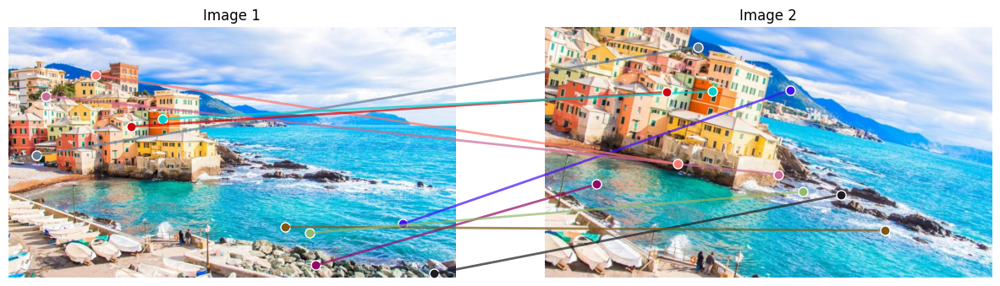

In [165]:
draw_random_matches(image_1, keypoints_image_1, image_2, keypoints_image_2, matches, subset_size=10)

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (15 points)</font>

In this question, you will implement the RANSAC algorithm to filter out outlier matches between two sets of keypoints by fitting an affine transformation model. You have to complete the following functions:

1. **compute_affine_transformation_matrix:** This function takes a set of point correspondences and computes an affine transformation matrix using those points.
2. **test_affine_transformation_matrix:** This function tests the computed affine transformation matrix on a set of point correspondences and identifies the inliers based on a given threshold.
3. **ransac_algorithm:** This function applies the RANSAC algorithm to find the best affine transformation matrix by repeatedly sampling points and testing the model.

**Note:** You are only allowed to use the Numpy library to implement these functions.

In [166]:
def compute_affine_transformation_matrix(data):
    """
    Compute a affine transformation matrix using a set of point correspondences.

    Args:
        data: An array containing point correspondences between two images.

    Returns:
        transformation_matrix: A affine transformation matrix.
    """

    num_points = data.shape[0]

    # Extract coordinates using vectorized operations
    src_points = data[:, :2]  # [x, y] coordinates
    dst_points = data[:, 2:]  # [u, v] coordinates

    # Create homogeneous coordinates for source points [x, y, 1]
    src_homogeneous = np.hstack([src_points, np.ones((num_points, 1))])

    # Create the 2n × 6 matrix A and 2n vector b
    A = np.zeros((2 * num_points, 6), dtype=np.float64)
    b = np.zeros(2 * num_points, dtype=np.float64)

    # Vectorized construction of matrix A and vector b
    # For rows corresponding to u = m1*x + m2*y + t1 (even indices: 0, 2, 4, ...)
    A[0::2, :3] = src_homogeneous  # [x, y, 1, 0, 0, 0]
    A[0::2, 3:] = 0

    # For rows corresponding to v = m3*x + m4*y + t2 (odd indices: 1, 3, 5, ...)
    A[1::2, :3] = 0
    A[1::2, 3:] = src_homogeneous  # [0, 0, 0, x, y, 1]

    b[0::2] = dst_points[:, 0]  # u coordinates
    b[1::2] = dst_points[:, 1]  # v coordinates

    # Solve for the affine parameters using least squares
    affine_params, _, _, _ = np.linalg.lstsq(A, b, rcond=None)

    # Reshape the parameters into a 2x3 transformation matrix
    transformation_matrix = affine_params.reshape(2, 3)

    return transformation_matrix

In [167]:
def test_affine_transformation_matrix(transformation_matrix, data, threshold=10):
    """
    Test the affine transformation matrix on a set of point correspondences 
    and identify inliers.

    Args:
        transformation_matrix: A affine transformation matrix.
        data: An array containing point correspondences.
        threshold: The distance threshold to consider a transformed point as 
                   an inlier. Default is 10.

    Returns:
        inliers: A list of indices of the inliers within the input data.
    """

    num_points = data.shape[0]

    # Extract source and destination points
    src_points = data[:, :2]  # [x, y] coordinates from image 1
    dst_points = data[:, 2:]  # [u, v] coordinates from image 2

    # Create homogeneous coordinates for source points [x, y, 1]
    src_homogeneous = np.hstack([src_points, np.ones((num_points, 1))])

    # Apply the affine transformation to all source points
    transformed_points = (transformation_matrix @ src_homogeneous.T).T

    # Compute Euclidean distances between transformed points and target points
    distances = np.sqrt(np.sum((transformed_points - dst_points) ** 2, axis=1))

    # Find inliers
    inlier_mask = distances < threshold
    inliers = np.where(inlier_mask)[0].tolist()

    return inliers

In [168]:
def ransac_algorithm(keypoints_1, keypoints_2, matches, num_iterations, num_points=3, threshold=10):
    """
    Apply the RANSAC algorithm to filter out outlier matches between two sets of
    keypoints by fitting a affine transformation model.

    Args:
        keypoints_1: The keypoints from the first image.
        keypoints_2: The keypoints from the second image.
        matches: A list of matches between keypoints_1 and keypoints_2.
        num_iterations: The number of iterations for the RANSAC algorithm.
        num_points: The number of points to randomly sample in each iteration
                    to fit the model. Default is 3.
        threshold: The distance threshold to consider a matched pair as an
                   inlier. Default is 10.

    Returns:
        best_transformation_matrix: The best transformation matrix found by RANSAC.
                                    None may be returned if the matrix cannot be computed.
    """

    # Initialize variables to track the best model
    best_transformation_matrix = None
    max_inliers_count = 0

    # Convert matches to data format (x, y, u, v)
    points_1 = np.array([keypoints_1[m.queryIdx].pt for m in matches])
    points_2 = np.array([keypoints_2[m.trainIdx].pt for m in matches])

    # Stack points together to create data array of shape (n, 4)
    all_matches_data = np.hstack((points_1, points_2))

    # RANSAC iterations
    for iteration in range(num_iterations):
        # Step 1: Randomly sample num_points matches
        sample_indices = np.random.choice(len(matches), num_points, replace=False)
        sample_data = all_matches_data[sample_indices]

        # Step 2: Compute affine transformation matrix from sample
        transformation_matrix = compute_affine_transformation_matrix(sample_data)

        # Step 3: Test the transformation on all matches and identify inliers
        inliers = test_affine_transformation_matrix(transformation_matrix, all_matches_data, threshold)

        # Step 4: Check if this is the best model so far
        if len(inliers) > max_inliers_count:
            max_inliers_count = len(inliers)
            best_transformation_matrix = transformation_matrix.copy()

    # Print information
    print("Total number of matches: ", len(matches))
    print("Inliers found:           ", max_inliers_count)
    print("Outliers removed:        ", len(matches) - max_inliers_count)

    return best_transformation_matrix

In [169]:
num_iterations = 30
num_points = 3
threshold = 10

best_transformation_matrix = ransac_algorithm(keypoints_image_1, keypoints_image_2, matches, num_iterations, num_points, threshold)

# Print the best matrix
print(f'\nBest matrix:\n{best_transformation_matrix}')

Total number of matches:  14514
Inliers found:            5537
Outliers removed:         8977

Best matrix:
[[ 1.11375363e+00 -2.47550748e-01 -4.59855375e+01]
 [ 2.59608415e-01  1.12182262e+00 -3.14091442e+02]]


<a id="question-5"></a>
#### <font color='#FF0000'>Question 4 (5 points)</font>

In this question, you will implement an affine transformation on an image using the transformation matrix obtained from the RANSAC algorithm in the previous question.

Create a function named `apply_affine_transformation` that takes an image and a 2x3 affine transformation matrix as input. The function should perform the affine transformation using either forward or inverse warping, based on the specified method.

Ensure that the transformed image maintains the same dimensions as the input image. The function should handle cases where the transformed coordinates go out of bounds by ignoring those pixels. You can use the resulting transformation matrix from Question 4 as the input for this function.

**Note:** You are only allowed to use the Numpy library to implement this function.

In [170]:
def apply_affine_transformation(image, transformation_matrix, warp_method='forward'):
    """
    Perform an affine transformation on an image.

    Args:
        image: Input image, expected shape (height, width, [channels])
        transformation_matrix: 2x3 affine transformation matrix
        warp_method: Either 'forward' or 'inverse' for the desired warping method. Default is 'forward'.

    Returns:
        transformed_image: Transformed image of the same shape as input
    """


    # Get image dimensions
    height, width, channels = image.shape
    transformed_image = np.zeros_like(image)

    if warp_method == 'forward':
        # Create coordinate grids for source image
        y_coords, x_coords = np.mgrid[0:height, 0:width]

        # Convert to homogeneous coordinates [x, y, 1]
        coords_homogeneous = np.stack([x_coords.ravel(), y_coords.ravel(), np.ones(height * width)])

        # Apply transformation: [u, v] = T @ [x, y, 1]
        transformed_coords = transformation_matrix @ coords_homogeneous

        # Extract transformed coordinates
        u_coords = transformed_coords[0].reshape(height, width)
        v_coords = transformed_coords[1].reshape(height, width)

        # Round to nearest integer for nearest neighbor interpolation
        u_rounded = np.round(u_coords).astype(int)
        v_rounded = np.round(v_coords).astype(int)

        # Create masks for valid coordinates (within bounds)
        valid_mask = (u_rounded >= 0) & (u_rounded < width) & (v_rounded >= 0) & (v_rounded < height)

        # Get valid source and destination coordinates
        valid_y, valid_x = np.where(valid_mask)
        valid_u = u_rounded[valid_mask]
        valid_v = v_rounded[valid_mask]

        # Copy pixels from source to destination
        transformed_image[valid_v, valid_u] = image[valid_y, valid_x]

    elif warp_method == 'inverse': # Inverse warping: for each destination pixel, find source pixel
        # Add bottom row [0, 0, 1] to make it 3x3 for easier inversion
        T_full = np.vstack([transformation_matrix, [0, 0, 1]])

        T_inv = np.linalg.inv(T_full)[:2, :]  # Take only first 2 rows

        # Create coordinate grids for destination image
        v_coords, u_coords = np.mgrid[0:height, 0:width]

        # Convert to homogeneous coordinates [u, v, 1]
        coords_homogeneous = np.stack([u_coords.ravel(), v_coords.ravel(), np.ones(height * width)])

        # Apply inverse transformation: [x, y] = T_inv @ [u, v, 1]
        source_coords = T_inv @ coords_homogeneous

        # Extract source coordinates
        x_coords = source_coords[0].reshape(height, width)
        y_coords = source_coords[1].reshape(height, width)

        # Round to nearest integer for nearest neighbor interpolation
        x_rounded = np.round(x_coords).astype(int)
        y_rounded = np.round(y_coords).astype(int)

        # Create masks for valid coordinates (within source image bounds)
        valid_mask = (x_rounded >= 0) & (x_rounded < width) & (y_rounded >= 0) & (y_rounded < height)

        # Get valid destination coordinates
        valid_v, valid_u = np.where(valid_mask)
        valid_x = x_rounded[valid_mask]
        valid_y = y_rounded[valid_mask]

        # Copy pixels from source to destination
        transformed_image[valid_v, valid_u] = image[valid_y, valid_x]

    else:
        raise ValueError("warp_method must be either 'forward' or 'inverse'")

    return transformed_image

<a id="question-6"></a>
#### <font color='#FF0000'>Question 5 (5 points)</font>

Create a function named **visualize_affine_transformations()** that takes the source image, reference image, and the best transformation matrix as inputs, and visualizes the results using four different methods: forward warping, inverse warping, OpenCV’s `warpAffine`, and the original reference image.

The function should display the results in a 2x4 grid of subplots:
- The first row will display the full images transformed by each method.
- The second row will display a zoomed-in section of each transformation for closer inspection.

Ensure that the subplots are well-labeled and that the zoomed-in sections provide a clear view of the differences between the methods.

In [171]:
def visualize_affine_transformations(source_image, reference_image, transformation_matrix):
    """
    Compare different affine transformation methods in a 2x4 grid visualization.

    Args:
        source_image: Source image to transform
        reference_image: Reference image to compare against
        transformation_matrix: Best transformation matrix

    Returns:
        None. Displays a plot without returning a value.
    """

    # Create figure with 2x4 subplots
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    # Define zoom region for detailed comparison
    zoom_y_start, zoom_y_end = 100, 300
    zoom_x_start, zoom_x_end = 100, 300

    # Ensure zoom region is within image bounds
    height, width = reference_image.shape[:2]
    zoom_y_end = min(zoom_y_end, height)
    zoom_x_end = min(zoom_x_end, width)

    # Transform source image using different methods
    transformed_images = []
    method_names = ['Forward Warping', 'Inverse Warping', 'OpenCV warpAffine', 'Reference Image']

    # Method 1: Forward Warping
    forward_transformed = apply_affine_transformation(source_image, transformation_matrix, warp_method='forward')
    transformed_images.append(forward_transformed)

    # Method 2: Inverse Warping
    inverse_transformed = apply_affine_transformation(source_image, transformation_matrix, warp_method='inverse')
    transformed_images.append(inverse_transformed)

    # Method 3: OpenCV warpAffine
    opencv_transformed = cv2.warpAffine(source_image, transformation_matrix,
                                      (reference_image.shape[1], reference_image.shape[0]))
    transformed_images.append(opencv_transformed)

    # Method 4: Reference image (target)
    transformed_images.append(reference_image)

    # Display full images in first row and zoomed regions in second row
    for i, (img, method_name) in enumerate(zip(transformed_images, method_names)):
        # First row: Full images
        axes[0, i].imshow(img)
        axes[0, i].set_title(f'{method_name}', fontsize=12, fontweight='bold')
        axes[0, i].axis('off')

        # Add red rectangle to show zoom region (only for transformation methods)
        if i < 3:  # Don't add rectangle to reference image
            rect = plt.Rectangle((zoom_x_start, zoom_y_start),
                               zoom_x_end - zoom_x_start,
                               zoom_y_end - zoom_y_start,
                               linewidth=2, edgecolor='red', facecolor='none')
            axes[0, i].add_patch(rect)

        # Second row: Zoomed regions
        zoomed_img = img[zoom_y_start:zoom_y_end, zoom_x_start:zoom_x_end]
        axes[1, i].imshow(zoomed_img)
        axes[1, i].set_title(f'{method_name} (Zoomed)', fontsize=12)
        axes[1, i].axis('off')

    plt.show()

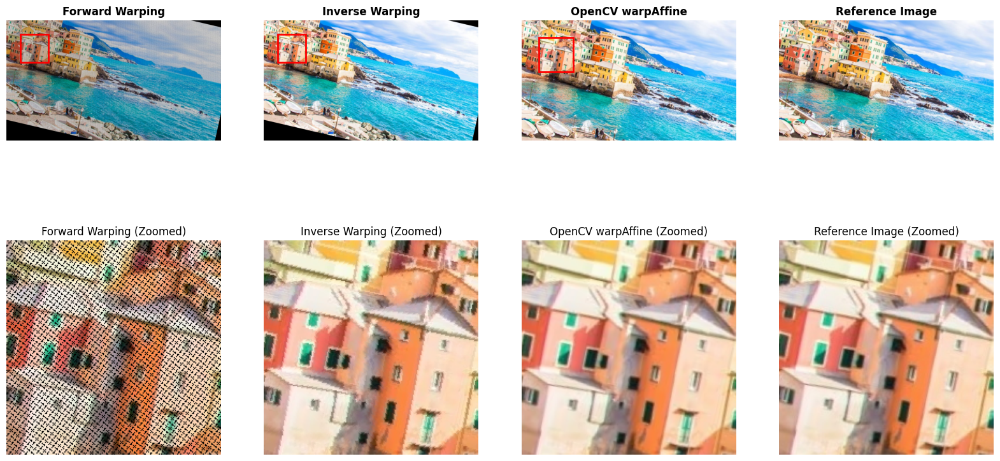

In [172]:
num_iterations = 30
num_points = 3
threshold = 10

visualize_affine_transformations(image_1, image_2, best_transformation_matrix)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (3 points)</font>

How many matches are required to solve an affine transformation formulated as follows:

$
\begin{bmatrix}
x'\\y'
\end{bmatrix} =
\begin{bmatrix}
m_1 & m_2\\
m_3 & m_4
\end{bmatrix}
\begin{bmatrix}
x\\y
\end{bmatrix} +
\begin{bmatrix}
t_1\\t_2
\end{bmatrix}
$

This equation can be rewritten as:

$
\begin{bmatrix}
x&y&0&0&1&0\\
0&0&x&y&0&1
\end{bmatrix}
\begin{bmatrix}
m_1\\
m_2\\
m_3\\
m_4\\
t_1\\
t_2
\end{bmatrix} =
\begin{bmatrix}
x'\\y'
\end{bmatrix}
$

Alternatively:

$
Ax = b, \;
A = \begin{bmatrix}
x&y&0&0&1&0\\
0&0&x&y&0&1
\end{bmatrix}, \;
x = \begin{bmatrix}
m_1\\
m_2\\
m_3\\
m_4\\
t_1\\
t_2
\end{bmatrix}, \;
b = \begin{bmatrix}
x'\\y'
\end{bmatrix}
$

##### <font color='yellow'>Answer:</font>

Three total matches would be sufficient, since an affine transformation can be represented by the following two equations:

$x \cdot m_1 + y \cdot m_2 + t_1 = x'$

$\newline$

$x \cdot m_3 + y \cdot m_4 + t_2 = y'$

In each of the above equations there are three unknowns. The first one involves $m_1, m_2,$ and $t_1$, while the second one involves $m_3, m_4,$ and $t_2$. 
Having three distinct points $(x, y)$ provides three independent equations of each type, which is just enough to solve for the three parameters in both cases.

So with three different matches we can determine all six unknown parameters $(m_1, m_2, m_3, m_4, t_1, t_2)$ that define the affine transformation. More matches could still be used, but they would only make the system overdetermined.


<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (5 points)</font>

What happens if we have more point matches than the minimum required for solving an affine transformation? Will the code still work, and why?

##### <font color='yellow'>Answer:</font>

If we use more than three matches, then the system becomes overdetermined, meaning that there are more equations than unknowns. For an affine transformation we have six parameters $(m_1, m_2, m_3, m_4, t_1, t_2)$ to find, and each pair of matching points $(x, y) \leftrightarrow (x', y')$ gives two equations. 

With exactly three matches we get six equations, which is just enough to solve for the six unknowns, as long as the points are not degenerate (for example, all on the same line). But when we use more than three matches, we start getting too many equations, which can’t all be satisfied at the same time for one single affine transform.

In real data this is what happens most of the time, because the points never match perfectly. There is always some level of noise or mismatch, which makes it impossible to satisfy all equations exactly. To deal with this, the code uses a least-squares solution to find the affine matrix that best fits all the correspondences on average. Having more matches actually helps, since it makes the result more stable and averages out small errors. Therefore, the code still works in this situation.

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (7 points)</font>

How many iterations are required in RANSAC to reliably find the correct transformation parameters? Provide a detailed explanation, and use mulitple figures to support your answer.

##### <font color='yellow'>Answer:</font>

To determine the number of iterations required in RANSAC to reliably find the correct transformation parameters, we will use a purely empirical approach.

The method is:
1. Run RANSAC with varying numbers of iterations (10, 50, 100, 200, 500, 1000)
2. For each iteration count, run multiple trials to account for RANSAC's randomness
3. Count the number of inliers found in each trial
4. Identify where performance stabilizes (adding more iterations gives minimal improvement)

This approach works because it uses real data from the dataset and shows actual convergence behaviour. Below, we show the empirical analysis and result visualization to find the optimal number of iterations:

Testing 6 iteration counts (10 trials each)...

Total number of matches:  14514
Inliers found:            5533
Outliers removed:         8981
Total number of matches:  14514
Inliers found:            5534
Outliers removed:         8980
Total number of matches:  14514
Inliers found:            5207
Outliers removed:         9307
Total number of matches:  14514
Inliers found:            5533
Outliers removed:         8981
Total number of matches:  14514
Inliers found:            5534
Outliers removed:         8980
Total number of matches:  14514
Inliers found:            5531
Outliers removed:         8983
Total number of matches:  14514
Inliers found:            2116
Outliers removed:         12398
Total number of matches:  14514
Inliers found:            106
Outliers removed:         14408
Total number of matches:  14514
Inliers found:            5533
Outliers removed:         8981
Total number of matches:  14514
Inliers found:            5533
Outliers removed:         8981
  10 iterat

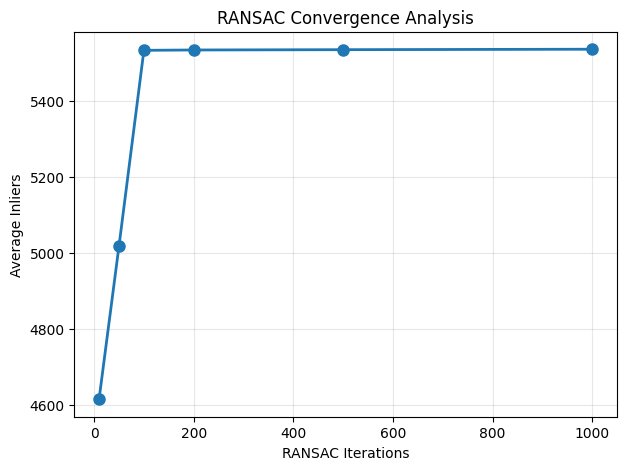


No clear convergence point found — try extending iteration range.


In [173]:
# Empirical analysis to determine optimal number of RANSAC iterations
test_iterations = [10, 50, 100, 200, 500, 1000]
num_trials = 10 

avg_inliers = []

points_1 = np.array([keypoints_image_1[m.queryIdx].pt for m in matches])
points_2 = np.array([keypoints_image_2[m.trainIdx].pt for m in matches])
all_matches = np.hstack((points_1, points_2))

print(f"Testing {len(test_iterations)} iteration counts ({num_trials} trials each)...\n")

for n_iter in test_iterations:
    trial_results = []
    for _ in range(num_trials):
        T = ransac_algorithm(
            keypoints_image_1, keypoints_image_2, matches,
            num_iterations=n_iter, num_points=3, threshold=10
        )
        inliers = test_affine_transformation_matrix(T, all_matches, threshold=10)
        trial_results.append(len(inliers))
    
    avg = np.mean(trial_results)
    avg_inliers.append(avg)
    print(f"{n_iter:4d} iterations → {avg:.1f} avg inliers")

# plot average inlers vs iterations
plt.figure(figsize=(7, 5))
plt.plot(test_iterations, avg_inliers, 'o-', linewidth=2, markersize=8)
plt.xlabel('RANSAC Iterations')
plt.ylabel('Average Inliers')
plt.title('RANSAC Convergence Analysis')
plt.grid(True, alpha=0.3)
plt.show()

# Estimate convergence point
diffs = np.diff(avg_inliers)
convergence = next((test_iterations[i+1] for i, d in enumerate(diffs) if d < 0.5), None)

if convergence:
    print(f"\nConvergence detected around {convergence} iterations.")
else:
    print("\nNo clear convergence point found — try extending iteration range.")


The convergence analysis shows that the number of inliers increases rapidly as the number of RANSAC iterations grows from 10 to around 200, after which the performance curve flattens. Beyond approximately 500 iterations, the average number of inliers remains nearly constant, indicating that additional iterations bring minimal improvement. Therefore, running RANSAC with about 500 iterations is sufficient to achieve reliable and stable results without unnecessary computational overhead.

<a id="section-2"></a>
### **Section 2: Image Stitching**

In this section, we will explore the process of image stitching, a technique used to combine multiple images into a single, seamless panorama. This process involves aligning and blending overlapping images to create a larger, cohesive image. By determining the geometric transformation needed to align one image with another, we can map the images to a common coordinate system. Image stitching is widely used in various applications, including photography, computer vision, and virtual reality, where creating wide-angle or high-resolution images from multiple photos is essential.

<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (20 points)</font>

Create a function named **stitch_images_together()** that takes a pair of images and the matching keypoints between them as input. T

The function should:
- Estimate the size of the stitched image.
- Transform one image into the coordinate space of the other.
- Combine the transformed image with the other to create a seamless panorama.

Ensure that the function correctly handles both directions—transforming the first image to the coordinate space of the second, and vice versa. The final output should be well-stitched and padded rather than cropped.

**Note:** You can use the `cv2.warpAffine` function to apply the transformation to the images. But you should implement the stitching process yourself **without** using any built-in stitching functions from OpenCV.

In [174]:
def stitch_images_together(image_1, image_2, transformation_matrix):
    """
    Given two input images, stitch image_1 onto image_2.

    Args:
        image_1: The first image (in RGB).
        image_2: The second image (in RGB).
        transformation_matrix: Transformation matrix for image_1 to match image_2

    Returns:
        output_image: The stitched image combining the two input images.
        offset_image_2: Offset of image_2 in the new output image coordinate system.
    """

    # get the size of both images
    h1, w1, _ = image_1.shape
    h2, w2, _ = image_2.shape

    # transform one image (image 1) into the coordinate system of the other (image 2)
    corners_image_1 = np.array([[0, 0], [w1, 0], [0, h1], [w1, h1]])
    corners_image_1_homogeneous = np.hstack([corners_image_1, np.ones((4, 1))])
    transformation_matrix = np.asarray(transformation_matrix, dtype=np.float32)
    transformed_corners_image_1 = (transformation_matrix @ corners_image_1_homogeneous.T).T

    # find the size of the output image
    corners_image_2 = np.array([[0, 0], [w2, 0], [0, h2], [w2, h2]])

    x_stacked = np.hstack([transformed_corners_image_1[:, 0], corners_image_2[:, 0]])
    y_stacked = np.hstack([transformed_corners_image_1[:, 1], corners_image_2[:, 1]])
    min_x, min_y = np.floor(x_stacked.min()), np.floor(y_stacked.min())
    max_x, max_y = np.ceil(x_stacked.max()), np.ceil(y_stacked.max())

    # translate the coordinates to ensure all coordinates are positive
    translation_x = int(-min(0, min_x))
    translation_y = int(-min(0, min_y))
    offset_image_2 = (translation_x, translation_y)

    width_output = int(max_x - min_x)
    height_output = int(max_y - min_y)

    # create correct translation and transformation matrix for warping
    translation_matrix = np.array([[1, 0, translation_x],
                               [0, 1, translation_y],
                               [0, 0, 1]], dtype=np.float32)
    transformation_matrix = np.vstack([transformation_matrix, [0, 0, 1]]).astype(np.float32)

    shifted_transformation_matrix = (translation_matrix @ transformation_matrix)[:2, :].astype(np.float32)
    translation_matrix = translation_matrix[:2, :].astype(np.float32)

    # warp both images into the output image coordinate system
    warped_image_1 = cv2.warpAffine(image_1, shifted_transformation_matrix, (width_output, height_output))
    warped_image_2 = cv2.warpAffine(image_2, translation_matrix, (width_output, height_output))

    # combine the two warped images
    mask1 = (warped_image_1.sum(axis=2) > 0)
    mask2 = (warped_image_2.sum(axis=2) > 0)

    output_image = warped_image_1.copy()
    output_image[~mask1] = warped_image_2[~mask1]

    overlap = mask1 & mask2
    output_image[overlap] = ((warped_image_1[overlap].astype(np.float32) +
                            warped_image_2[overlap].astype(np.float32)) / 2).astype(np.uint8)
    
    return output_image, offset_image_2

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (5 points)</font>

Write code to load the images `genoa_beach_cut_2.jpg` and `genoa_beach_cut_3.jpg`, stitch them together, and visualize the results. First, stitch `genoa_beach_cut_2.jpg` onto `genoa_beach_cut_3.jpg`, then perform the reverse operation by stitching `genoa_beach_cut_3.jpg` onto `genoa_beach_cut_2.jpg`. Visualize both original images and the resulting stitched images.

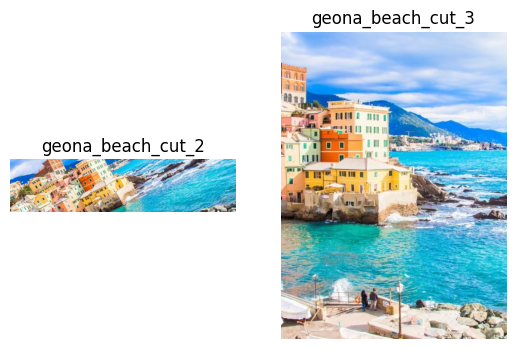

Finding matching features...
Number of keypoints in the first image:  5787
Number of keypoints in the second image: 5157
Number of matches: 5787
Total number of matches:  5787
Inliers found:            2056
Outliers removed:         3731


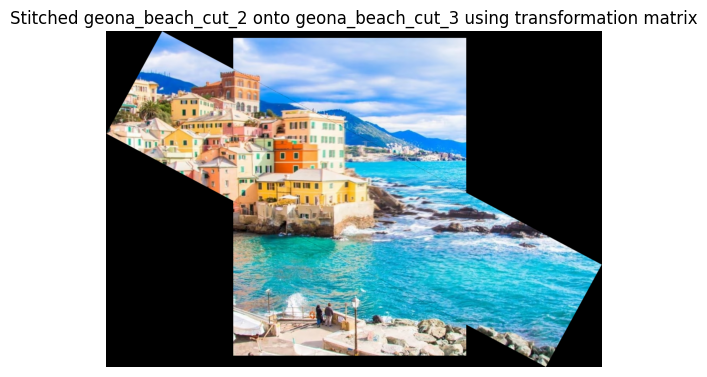

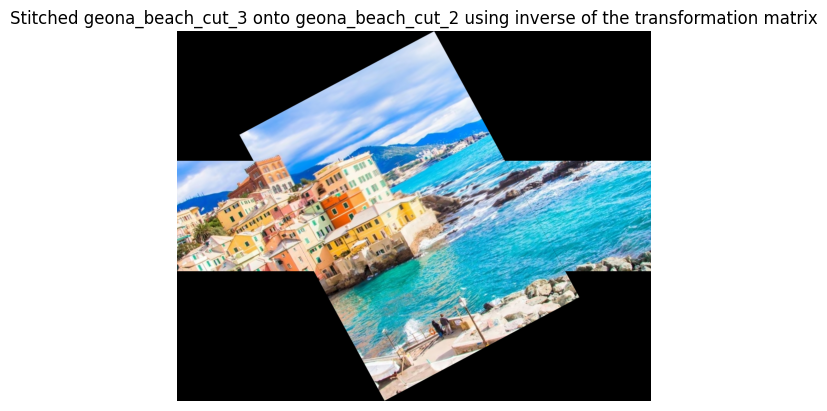

In [175]:
# load images
geona_beach_cut_2 = cv2.cvtColor(cv2.imread('images/genoa_beach_cut_2.jpg'), cv2.COLOR_BGR2RGB)
geona_beach_cut_3 = cv2.cvtColor(cv2.imread('images/genoa_beach_cut_3.jpg'), cv2.COLOR_BGR2RGB)

# show both images
plt.figure()
plt.subplot(1,2,1)
plt.imshow(geona_beach_cut_2)
plt.axis('off')
plt.title('geona_beach_cut_2')
plt.subplot(1,2,2)
plt.imshow(geona_beach_cut_3)
plt.axis('off')
plt.title('geona_beach_cut_3')
plt.show()

# find the matching keypoints between the two images
k1, k2, matches = get_matching_keypoints(geona_beach_cut_2, geona_beach_cut_3)

# run RANSAC to find the best transformation matrix
M_cut_2_onto_cut_3 = ransac_algorithm(k1, k2, matches, num_iterations=2000)

# stitch the two images together
cut_2_onto_cut_3_image, cut_2_onto_cut_3_offset = stitch_images_together(geona_beach_cut_2, geona_beach_cut_3, M_cut_2_onto_cut_3)

# display geona_beach_cut_2 stitched onto geona_beach_cut_3
plt.figure()
plt.imshow(cut_2_onto_cut_3_image)
plt.axis('off')
plt.title('Stitched geona_beach_cut_2 onto geona_beach_cut_3 using transformation matrix')
plt.show()


# get the inverse transformation matrix to stitch the images the other way around
M_cut_3_onto_cut_2 = np.linalg.inv(np.vstack([M_cut_2_onto_cut_3, [0, 0, 1]]))[:2, :].astype(np.float32)

# stitch the two images together the other way around
cut_3_onto_cut_2_image, cut_3_onto_cut_2_offset = stitch_images_together(geona_beach_cut_3, geona_beach_cut_2, M_cut_3_onto_cut_2)

# display geona_beach_cut_3 stitched onto geona_beach_cut_2
plt.figure()
plt.imshow(cut_3_onto_cut_2_image)
plt.axis('off')
plt.title('Stitched geona_beach_cut_3 onto geona_beach_cut_2 using inverse of the transformation matrix')
plt.show()

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (5 points)</font>

Now, write code to load the images `sciencepark_1.jpg` and `sciencepark_2.jpg`, stitch them together, and visualize the results. First, stitch `sciencepark_1.jpg` onto `sciencepark_2.jpg`, then perform the reverse operation by stitching `sciencepark_2.jpg` onto `sciencepark_1.jpg`. Visualize both original images and the resulting stitched images.

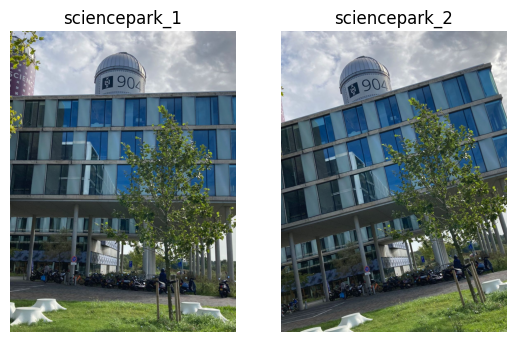

Finding matching features...
Number of keypoints in the first image:  10659
Number of keypoints in the second image: 11343
Number of matches: 10659
Total number of matches:  10659
Inliers found:            5658
Outliers removed:         5001


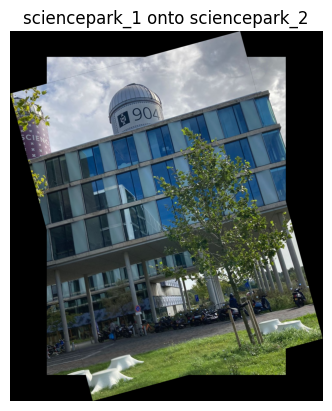

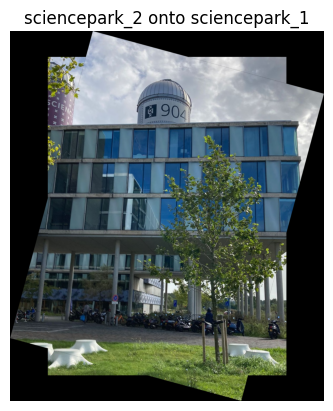

In [176]:
# load images
sciencepark_1 = cv2.cvtColor(cv2.imread('images/sciencepark_1.jpg'), cv2.COLOR_BGR2RGB)
sciencepark_2 = cv2.cvtColor(cv2.imread('images/sciencepark_2.jpg'), cv2.COLOR_BGR2RGB)

# show both images
plt.figure()
plt.subplot(1,2,1)
plt.imshow(sciencepark_1)
plt.axis('off')
plt.title('sciencepark_1')
plt.subplot(1,2,2)
plt.imshow(sciencepark_2)
plt.axis('off')
plt.title('sciencepark_2')
plt.show()

# find the matching keypoints between the two images
k1, k2, matches = get_matching_keypoints(sciencepark_1, sciencepark_2)

# run RANSAC to find the best transformation matrix
M_sciencepark_1_onto_sciencepark_2 = ransac_algorithm(k1, k2, matches, num_iterations=2000)

# stitch the two images together
sciencepark_1_onto_sciencepark_2_image, sciencepark_1_onto_sciencepark_2_offset = stitch_images_together(sciencepark_1, sciencepark_2, M_sciencepark_1_onto_sciencepark_2)

# display sciencepark_1 stitched onto sciencepark_2
plt.figure()
plt.imshow(sciencepark_1_onto_sciencepark_2_image)
plt.axis('off')
plt.title('sciencepark_1 onto sciencepark_2')
plt.show()

# get the inverse transformation matrix to stitch the images the other way around
M_sciencepark_2_onto_sciencepark_1 = np.linalg.inv(np.vstack([M_sciencepark_1_onto_sciencepark_2, [0, 0, 1]]))[:2, :].astype(np.float32)

# stitch the two images together the other way around
sciencepark_2_onto_sciencepark_1_image, sciencepark_2_onto_sciencepark_1_offset = stitch_images_together(sciencepark_2, sciencepark_1, M_sciencepark_2_onto_sciencepark_1)

# display sciencepark_2 stitched onto sciencepark_1
plt.figure()
plt.imshow(sciencepark_2_onto_sciencepark_1_image)
plt.axis('off')
plt.title('sciencepark_2 onto sciencepark_1')
plt.show()

<a id="section-3"></a>
### **Section 3: Automatic Panorama Stitching**

In this section, you will create a panorama by stitching together multiple images. The goal is to combine a series of images into a single, wide-angle view that captures the entire scene seamlessly. This process involves detecting features in each image, matching these features between consecutive images, and computing the geometric transformations needed to align and blend them into a cohesive panorama. By mapping the images to a common coordinate system using these transformations, you can effectively stitch them together into one continuous view.

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (15 points)</font>

Create a function named **`automatic_panorama_stitching(images, use_mask=True)`** that stitches a series of images together to create a panorama. The function should accept a list of input images and manually implement the stitching process using feature detection and matching techniques. This includes performing feature matching between images, estimating the homography between matched features, and warping images to align them into a panorama.

The function should handle cases where stitching fails, providing appropriate error messages if necessary. After stitching, and based on the **`use_mask`** parameter, the function should crop the stitched image using the bounding rectangle to remove unnecessary areas, such as black borders.

Apply your function on the image paths provided below and visualize the results for each set of images. Make sure to **also** visualize the difference between **`use_mask`** set to **True** and **False**.

```python
image_paths = [
    'panorama_images/panorama_cut_1.jpg',
    'panorama_images/panorama_cut_2.jpg',
    'panorama_images/panorama_cut_3.jpg',
    'panorama_images/panorama_cut_4.jpg',
]

image_paths = [
    'panorama_images/panorama_2_cut_1.jpg',
    'panorama_images/panorama_2_cut_2.jpg',
    'panorama_images/panorama_2_cut_3.jpg',
    'panorama_images/panorama_2_cut_4.jpg',
    'panorama_images/panorama_2_cut_5.jpg',
    'panorama_images/panorama_2_cut_6.jpg',
    'panorama_images/panorama_2_cut_7.jpg',
    'panorama_images/panorama_2_cut_8.jpg',
]
```

**Note:** You are allowed to use any of the functions you have implemented in the previous sections, but you are also allowed to use any other functions from OpenCV.

In [177]:
def automatic_panorama_stitching(images, use_mask=True):
    """
    Automatically stitch a series of images together to create a panorama.

    Args:
        images: A list of input images to stitch together.
        use_mask: A boolean indicating whether to use a mask for the final stitched image. (default is True)

    Returns:
        stitched: The final stitched image.
    """
    
    # Start with the first image
    panorama_result = images[0].copy()
    
    # Add each subsequent image one by one
    for idx in range(1, len(images)):
        
        try:
            # Find matching keypoints between current panorama and next image
            kp_panorama, kp_image, matches = get_matching_keypoints(panorama_result, images[idx])
            
            # Find transformation matrix using RANSAC
            transform_matrix = ransac_algorithm(
                kp_panorama, kp_image, matches,
                num_iterations=1000, num_points=3, threshold=10
            )
            
            # Stitch the images together
            panorama_result, _ = stitch_images_together(panorama_result, images[idx], transform_matrix)

    # Remove black borders if requested
    if use_mask:
        panorama_result = crop_panorama_borders(panorama_result)
    
    return panorama_result


def crop_panorama_borders(panorama_image):
    """
    Remove black borders from the panorama using a simple bounding box approach.
    
    Args:
        panorama_image: Input panorama with potential black borders
        
    Returns:
        Cropped panorama with black borders removed
    """

    gray_image = cv2.cvtColor(panorama_image, cv2.COLOR_RGB2GRAY)
    non_black_pixels = np.where(gray_image > 0)
    
    # If no valid pixels found, return original image
    if len(non_black_pixels[0]) == 0:
        return panorama_image
    
    # Find the bounding box of all non-black pixels
    y_min = non_black_pixels[0].min()
    y_max = non_black_pixels[0].max()
    x_min = non_black_pixels[1].min()
    x_max = non_black_pixels[1].max()
    
    # Crop the image to this bounding box
    cropped_image = panorama_image[y_min:y_max+1, x_min:x_max+1]
    
    return cropped_image

SyntaxError: expected 'except' or 'finally' block (1087807117.py, line 33)

Loaded panorama_images/panorama_cut_1.jpg - Shape: (541, 407, 3)
Loaded panorama_images/panorama_cut_2.jpg - Shape: (541, 407, 3)
Loaded panorama_images/panorama_cut_3.jpg - Shape: (541, 407, 3)
Loaded panorama_images/panorama_cut_4.jpg - Shape: (541, 407, 3)


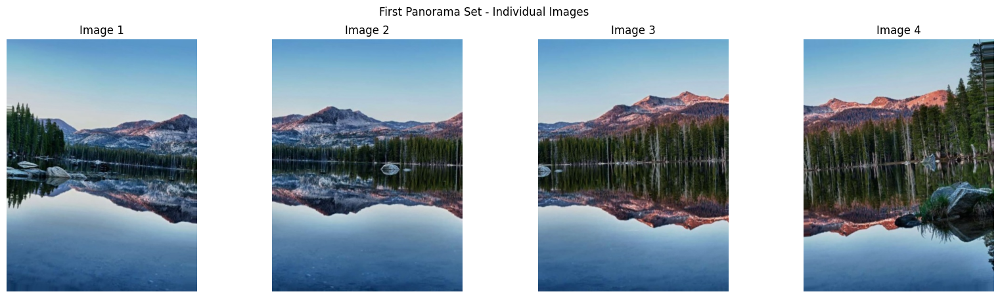


Creating panorama WITHOUT mask cropping...
Starting panorama creation with 4 images...
Processing image 2/4...
Finding matching features...
Number of keypoints in the first image:  1325
Number of keypoints in the second image: 1483
Number of matches: 1325
Total number of matches:  1325
Inliers found:            485
Outliers removed:         840
Successfully added image 2
Processing image 3/4...
Finding matching features...
Number of keypoints in the first image:  2131
Number of keypoints in the second image: 1519
Number of matches: 2131
Total number of matches:  2131
Inliers found:            325
Outliers removed:         1806
Successfully added image 3
Processing image 4/4...
Finding matching features...
Number of keypoints in the first image:  3146
Number of keypoints in the second image: 1970
Number of matches: 3146
Total number of matches:  3146
Inliers found:            445
Outliers removed:         2701
Successfully added image 4
Panorama creation completed!

Creating panorama W

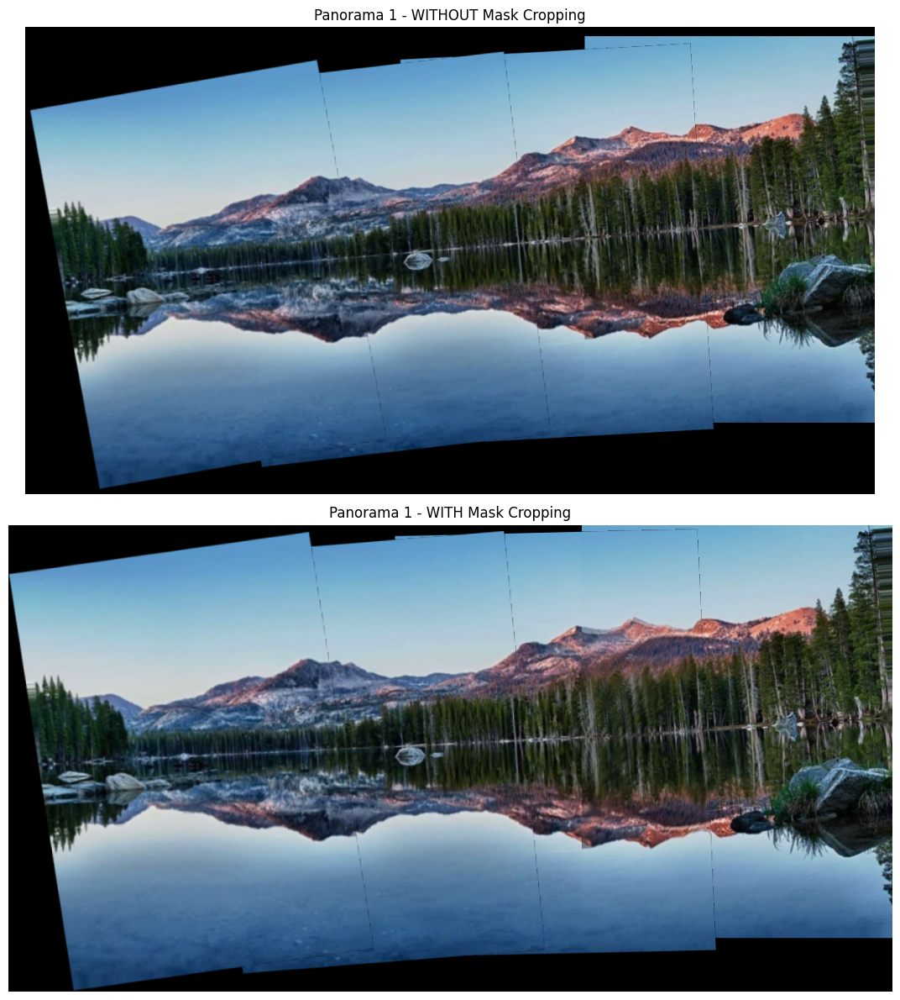

Original panorama shape: (654, 1192, 3)
Cropped panorama shape: (611, 1158, 3)


In [ ]:
# Test with the first set of panorama images

image_paths_1 = [
    'panorama_images/panorama_cut_1.jpg',
    'panorama_images/panorama_cut_2.jpg',
    'panorama_images/panorama_cut_3.jpg',
    'panorama_images/panorama_cut_4.jpg',
]

# Load the images
images_1 = []
for path in image_paths_1:
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    images_1.append(img)
    print(f"Loaded {path} - Shape: {img.shape}")

# Display the individual images
fig, axes = plt.subplots(1, len(images_1), figsize=(20, 5))
for i, img in enumerate(images_1):
    axes[i].imshow(img)
    axes[i].set_title(f'Image {i+1}')
    axes[i].axis('off')
plt.suptitle('First Panorama Set - Individual Images')
plt.show()

# Create panorama without mask
print("\nCreating panorama WITHOUT mask cropping...")
panorama_1_no_mask = automatic_panorama_stitching(images_1, use_mask=False)

# Create panorama with mask
print("\nCreating panorama WITH mask cropping...")
panorama_1_with_mask = automatic_panorama_stitching(images_1, use_mask=True)

# Display results
fig, axes = plt.subplots(2, 1, figsize=(20, 12))

axes[0].imshow(panorama_1_no_mask)
axes[0].set_title('Panorama 1 - WITHOUT Mask Cropping')
axes[0].axis('off')

axes[1].imshow(panorama_1_with_mask)
axes[1].set_title('Panorama 1 - WITH Mask Cropping')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Original panorama shape: {panorama_1_no_mask.shape}")
print(f"Cropped panorama shape: {panorama_1_with_mask.shape}")


Loaded panorama_images/panorama_2_cut_1.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_2.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_3.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_4.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_5.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_6.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_7.jpg - Shape: (2832, 2186, 3)
Loaded panorama_images/panorama_2_cut_8.jpg - Shape: (2832, 2186, 3)


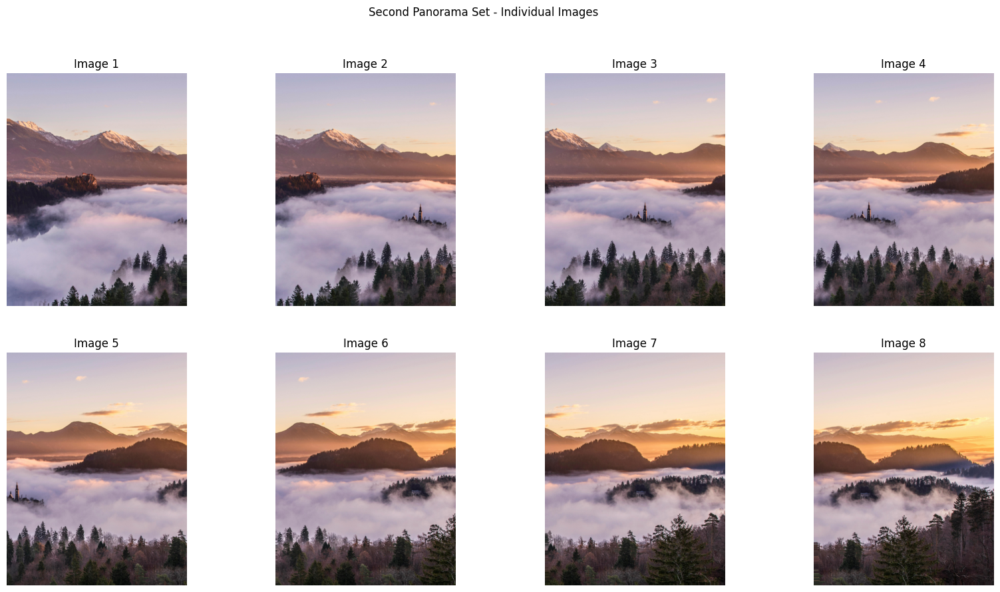


Creating panorama WITHOUT mask cropping...
Starting panorama creation with 8 images...
Processing image 2/8...
Finding matching features...
Number of keypoints in the first image:  5839
Number of keypoints in the second image: 7794
Number of matches: 5839
Total number of matches:  5839
Inliers found:            4231
Outliers removed:         1608
Successfully added image 2
Processing image 3/8...
Finding matching features...
Number of keypoints in the first image:  7371
Number of keypoints in the second image: 8854
Number of matches: 7371
Total number of matches:  7371
Inliers found:            4557
Outliers removed:         2814
Successfully added image 3
Processing image 4/8...
Finding matching features...
Number of keypoints in the first image:  8986
Number of keypoints in the second image: 8473
Number of matches: 8986
Total number of matches:  8986
Inliers found:            4756
Outliers removed:         4230
Successfully added image 4
Processing image 5/8...
Finding matching feat

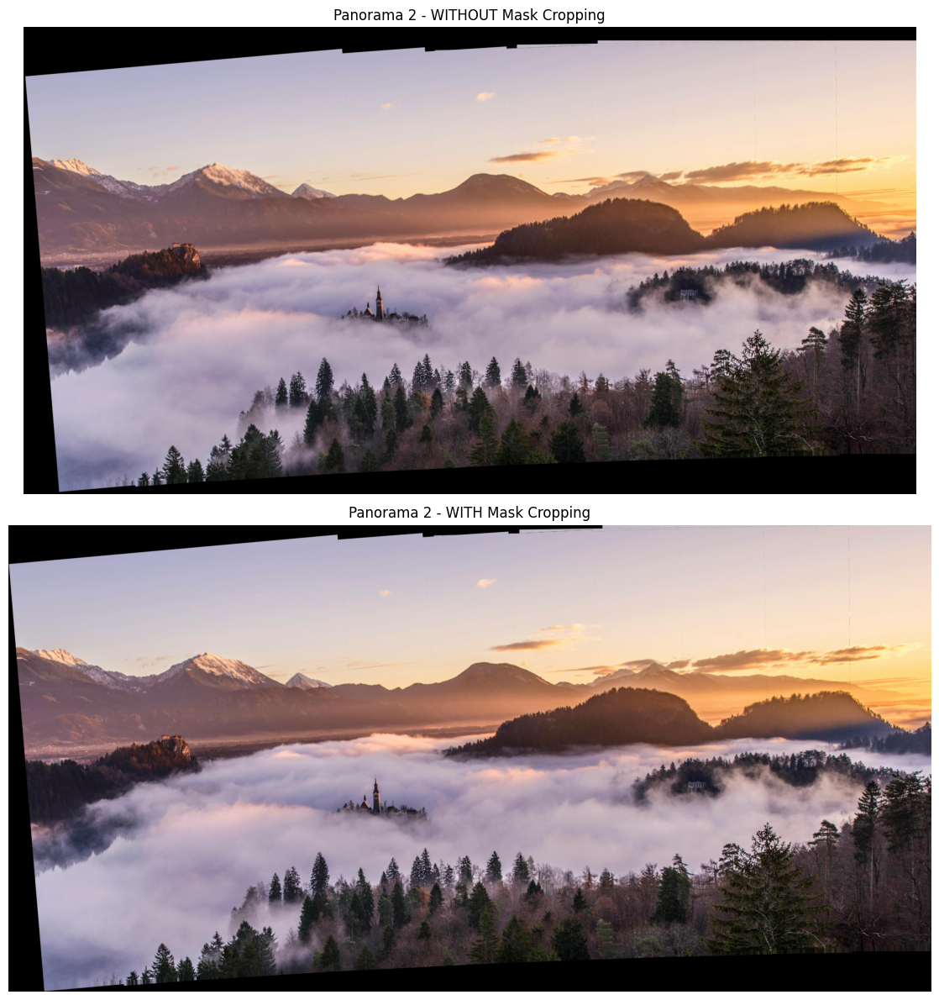

Original panorama shape: (3200, 6124, 3)
Cropped panorama shape: (3100, 6133, 3)


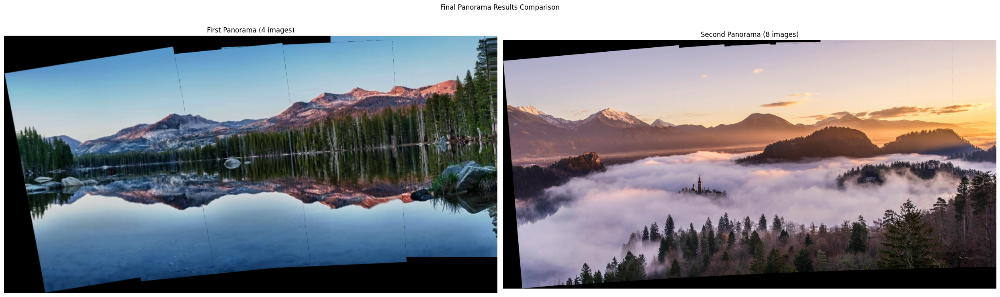

In [ ]:
# Test with the second set of panorama images

image_paths_2 = [
    'panorama_images/panorama_2_cut_1.jpg',
    'panorama_images/panorama_2_cut_2.jpg',
    'panorama_images/panorama_2_cut_3.jpg',
    'panorama_images/panorama_2_cut_4.jpg',
    'panorama_images/panorama_2_cut_5.jpg',
    'panorama_images/panorama_2_cut_6.jpg',
    'panorama_images/panorama_2_cut_7.jpg',
    'panorama_images/panorama_2_cut_8.jpg',
]

# Load the images
images_2 = []
for path in image_paths_2:
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    images_2.append(img)
    print(f"Loaded {path} - Shape: {img.shape}")

# Display the individual images
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
for i, img in enumerate(images_2):
    row = i // 4
    col = i % 4
    axes[row, col].imshow(img)
    axes[row, col].set_title(f'Image {i+1}')
    axes[row, col].axis('off')
plt.suptitle('Second Panorama Set - Individual Images')
plt.show()

# Create panorama without mask
print("\nCreating panorama WITHOUT mask cropping...")
panorama_2_no_mask = automatic_panorama_stitching(images_2, use_mask=False)

# Create panorama with mask
print("\nCreating panorama WITH mask cropping...")
panorama_2_with_mask = automatic_panorama_stitching(images_2, use_mask=True)

# Display results
fig, axes = plt.subplots(2, 1, figsize=(25, 12))

axes[0].imshow(panorama_2_no_mask)
axes[0].set_title('Panorama 2 - WITHOUT Mask Cropping')
axes[0].axis('off')

axes[1].imshow(panorama_2_with_mask)
axes[1].set_title('Panorama 2 - WITH Mask Cropping')
axes[1].axis('off')

plt.tight_layout()
plt.show()

print(f"Original panorama shape: {panorama_2_no_mask.shape}")
print(f"Cropped panorama shape: {panorama_2_with_mask.shape}")

# Display comparison side by side for better visualization
fig, axes = plt.subplots(1, 2, figsize=(25, 8))

axes[0].imshow(panorama_1_with_mask)
axes[0].set_title('First Panorama (4 images)')
axes[0].axis('off')

axes[1].imshow(panorama_2_with_mask)
axes[1].set_title('Second Panorama (8 images)')
axes[1].axis('off')

plt.suptitle('Final Panorama Results Comparison')
plt.tight_layout()
plt.show()

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
| May Daniel Ben Zion | 33.33333 % | 33.33333 % | 33.33333 % |
| Jonas Elzinga | 33.33333 % | 33.33333 % | 33.33333 % |
| Vlad Chibulcutean  | 33.33333 % | 33.33333 % | 33.33333 % |
|  | - % | - % | - % |

### - End of Notebook -
